In [1]:
# pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

In [2]:
# pip install opencv-python scikit-learn scipy matplotlib tqdm

In [3]:
import json
import os
import shutil
from xml.etree import ElementTree
import xml.etree.ElementTree as ET
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import random

# 1. Data Pre-Processing

## 1.1 Images

In [4]:
from pie_data import PIE
pie_path = "C:/Users/vravula/final_pie_env/"
imdb = PIE(data_path = pie_path)
imdb.extract_and_save_images(extract_frame_type = 'annotated', capture_interval_seconds = 1)

Extracting frames from set01
Generating annotated frame numbers for set01
video_0001


KeyboardInterrupt: 

## 1.2 Retrieve Bounding Boxes

In [3]:
import xml.etree.ElementTree as ET

def parse_annotations(xml_file, image_folder):
    
    """
    Gets all the all the predestrian bbox present in the frame
    """

    image_files = [int(os.path.splitext(f)[0]) for f in os.listdir(image_folder) if f.endswith('.png')]
    # image_file_set = set(image_files)

    tree = ET.parse(xml_file)
    root = tree.getroot()

    # Find the width and height elements
    original_size = root.find('.//original_size')
    w = int(original_size.find('width').text)
    h = int(original_size.find('height').text)

    class_dict = {"crossing":0,"not-crossing":1,"crossing-irrelevant":2}

    crossing_annotations = []
    
    for track in root.findall(".//track[@label='pedestrian']"):
        for box in track.findall(".//box"):
            frame = int(box.get("frame"))
            # print(frame)
            cross = box.find("./attribute[@name='cross']").text
            # print(cross)

            if cross in ["crossing", "not-crossing", "crossing-irrelevant"]:
                xtl = float(box.get("xtl"))
                ytl = float(box.get("ytl"))
                xbr = float(box.get("xbr"))
                ybr = float(box.get("ybr"))

                # print("xtl: ", xtl, "ytl: ", ytl, "xbr: ", xbr, "ybr: ", ybr)

                if frame in image_files:
                    crossing_annotations.append({
                        "frame": frame,
                        "bbox" : {"xtl": xtl, 
                                  "ytl": ytl, 
                                  "xbr": xbr, 
                                  "ybr": ybr},
                        "cross": cross,
                        "mapped_class": str(class_dict[cross])
                    })

    return crossing_annotations

def write_txt_files(annotations, output_folder):
    for annotation in annotations:
        frame = annotation['frame']

        output_file = os.path.join(output_folder, f"{frame}.txt")
        with open(output_file, 'w') as file:
            file.write(str(annotation))

def write_json_files(annotations, output_folder):
    for annotation in annotations:
        frame = annotation['frame']

        output_file = os.path.join(output_folder, f"{frame}.json")
        with open(output_file, 'w') as file:
            json.dump(annotation, file, indent=2)

def consolidate_and_combine_annotations(annotations):
    consolidated_data = {}

    for annotation in annotations:
        frame = annotation['frame']
        bbox = annotation['bbox']
        cross = annotation['cross']
        mapped_class = annotation['mapped_class']

        if frame not in consolidated_data:
            consolidated_data[frame] = {
                'bbox_list': [bbox],
                'cross_list': [cross],
                'mapped_class_list': [mapped_class]
            }
        else:
            consolidated_data[frame]['bbox_list'].append(bbox)
            consolidated_data[frame]['cross_list'].append(cross)
            consolidated_data[frame]['mapped_class_list'].append(mapped_class)

    combined_data = []

    for frame, data in consolidated_data.items():
        bbox_list = data['bbox_list']
        cross_list = data['cross_list']
        mapped_class_list = data['mapped_class_list']

        # Assuming all lists have the same length
        annotations_list = [
            {
                # 'frame': frame,
                'bbox': bbox_list[i],
                'cross': cross_list[i],
                'mapped_class': mapped_class_list[i]
            } for i in range(len(bbox_list))
        ]

        combined_data.append({
            'frame': frame,
            'annotations': annotations_list
        })

    return combined_data


def get_annotations(image_folder_path, annotation_folder_path, output_folder_path):

    pairs = []

    # Iterate through all folders in the image directory
    for folder_name in os.listdir(annotation_folder_path):
        folder_path = os.path.join(annotation_folder_path, folder_name)
        image_path = os.path.join(image_folder_path, folder_name)
        output_path = os.path.join(output_folder_path, folder_name)

        # Check if the item in the directory is a folder
        if os.path.isdir(folder_path) and os.path.isdir(image_path):
            print("Processing: ", folder_name)
            # Iterate through all XML files in the current folder
            for xml_filename in os.listdir(folder_path):
                for image_filename in os.listdir(image_path):
                    if image_filename in xml_filename:
                        # print(os.path.join(folder_path, xml_filename), os.path.join(image_path, image_filename))
                        out_path = os.path.join(output_path, image_filename)
                        
                        if not os.path.exists(out_path):
                            os.makedirs(out_path)

                        crossing_annotations = parse_annotations(os.path.join(folder_path, xml_filename), os.path.join(image_path, image_filename))
                        crossing_annotations = consolidate_and_combine_annotations(crossing_annotations)
                        write_json_files(crossing_annotations, out_path)

    print("Done retrieving annotations.")

In [4]:
get_annotations("images", "annotations", "retrieved_annotations")


Processing:  set01
Processing:  set02
Processing:  set03
Done retrieving annotations.


## 1.3 Displaying Image

In [5]:
def draw_boxes(image_path, annotation_file_path, fig_size=(20, 10)):

    # Read the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV reads images in BGR, convert to 

    # Getting annotations
    with open(annotation_file_path, 'r') as file:
        annotation_data = json.load(file)

    frame_annotation = annotation_data

    fig, ax = plt.subplots(1, figsize=fig_size)
    ax.imshow(image)

    frame = frame_annotation['frame']
    # print(frame)
    annotations = frame_annotation.get('annotations', [])
    # print(annotations)

    for bbox_info in annotations:
        class_label = bbox_info['cross']
        xmin = bbox_info['bbox']['xtl']
        ymin = bbox_info['bbox']['ytl']
        xmax = bbox_info['bbox']['xbr']
        ymax = bbox_info['bbox']['ybr']

        # Draw bounding box using matplotlib.patches
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=3, edgecolor='g', facecolor='none')
        ax.add_patch(rect)

        # Display class label
        ax.text(xmin, ymin - 5, class_label, color='g', fontsize=12, weight='bold')

    plt.axis('on')
    plt.show()


#### Test 1

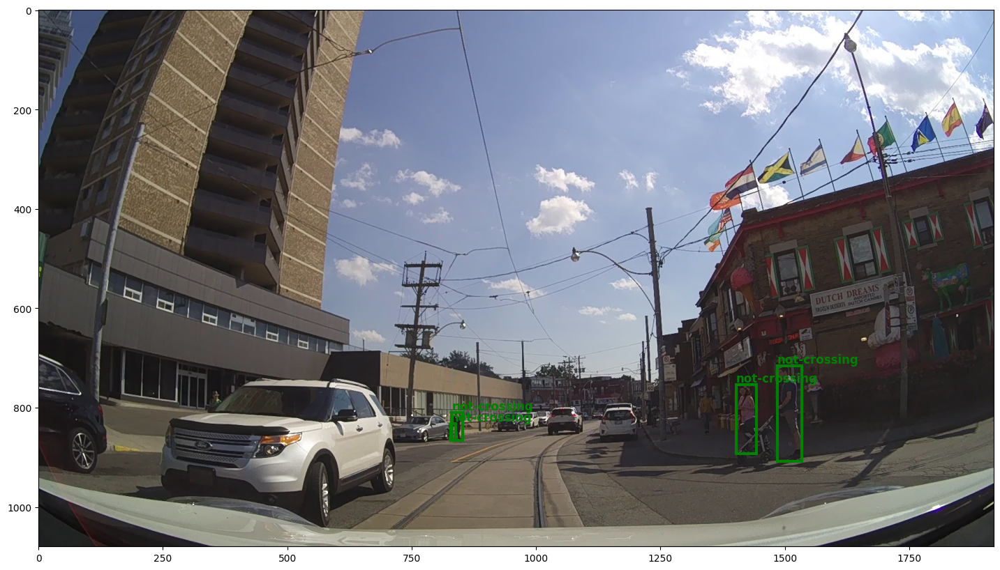

In [7]:
# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/images/set01/video_0001/01440.png"

annotation_file_path = r"C:/Users/vravula/final_pie_env/retrieved_annotations/set01/video_0001/1440.json"

# Draw bounding boxes on the image
draw_boxes(image_path, annotation_file_path)

#### Test 2

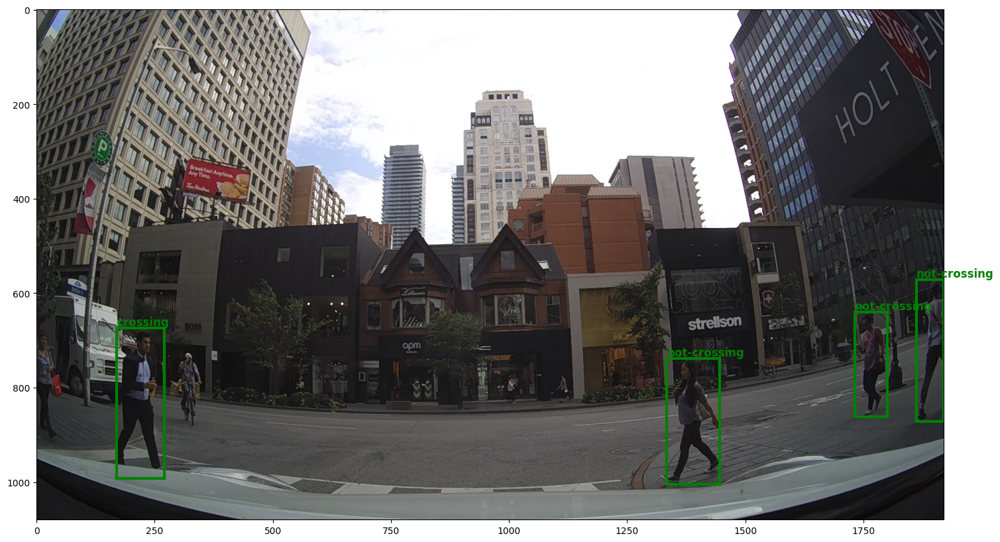

In [8]:
# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/images/set02/video_0003/01170.png"
annotation_file_path = r"C:/Users/vravula/final_pie_env/retrieved_annotations/set02/video_0003/1170.json"

# Draw bounding boxes on the image
draw_boxes(image_path, annotation_file_path)

#### Test 3

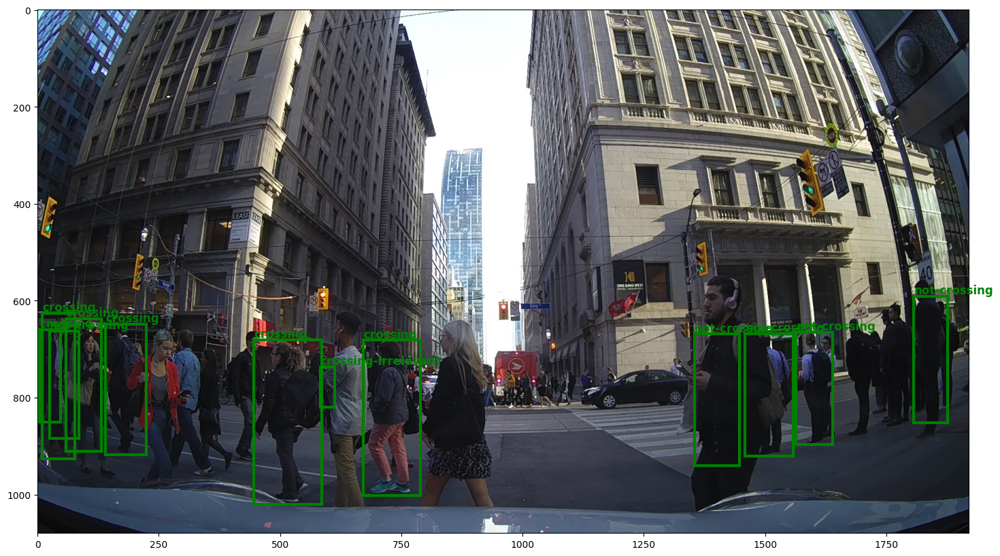

In [9]:
# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/images/set03/video_0015/03450.png"
annotation_file_path = r"C:/Users/vravula/final_pie_env/retrieved_annotations/set03/video_0015/3450.json"

# Draw bounding boxes on the image
draw_boxes(image_path, annotation_file_path)

#### Test 4

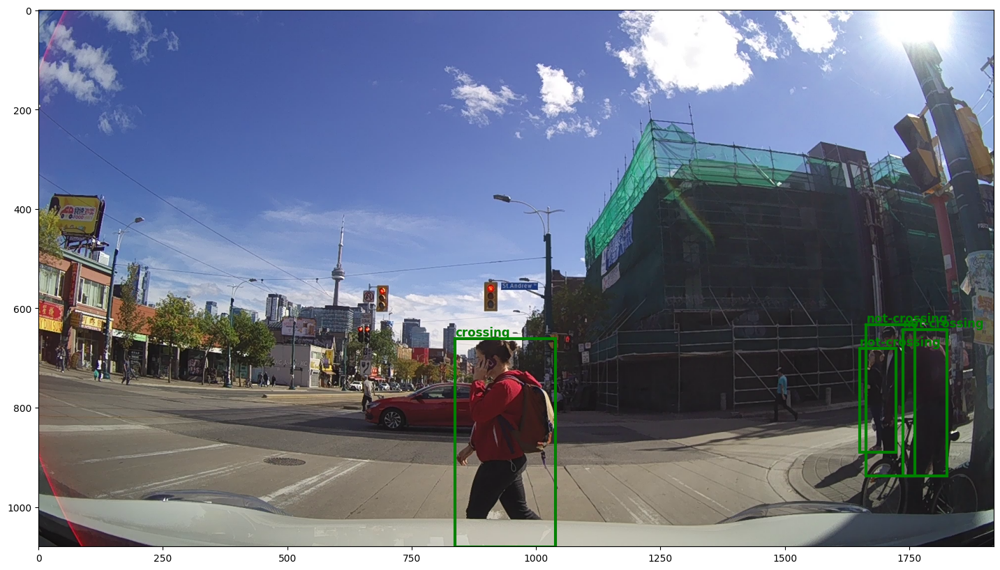

In [10]:
# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/images/set03/video_0005/03120.png"
annotation_file_path = r"C:/Users/vravula/final_pie_env/retrieved_annotations/set03/video_0005/3120.json"

# Draw bounding boxes on the image
draw_boxes(image_path, annotation_file_path)

#### Test 5

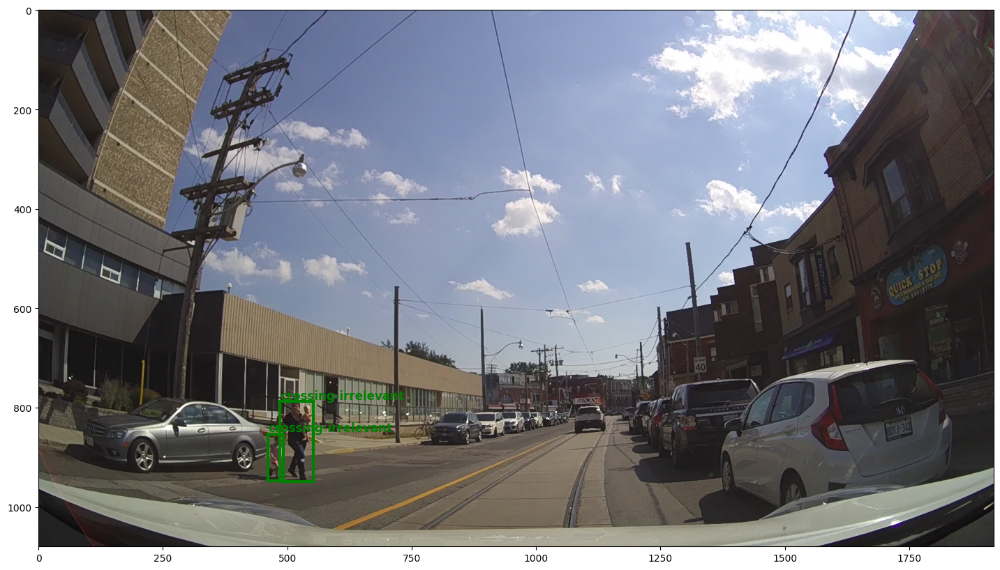

In [11]:
# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/images/set01/video_0001/01500.png"

annotation_file_path = r"C:/Users/vravula/final_pie_env/retrieved_annotations/set01/video_0001/1500.json"

# Draw bounding boxes on the image
draw_boxes(image_path, annotation_file_path)

#### Individual Test

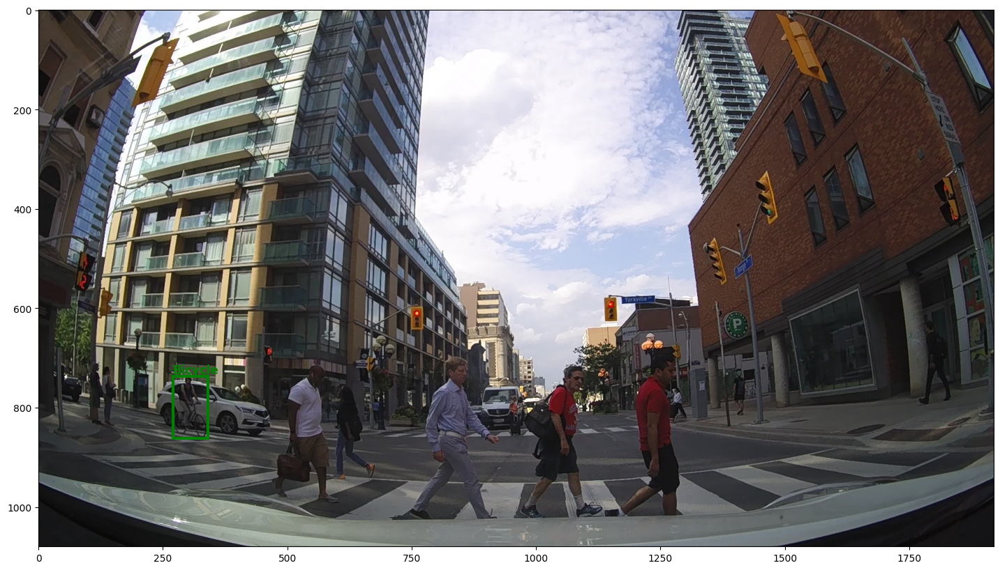

In [12]:
# Function to draw bounding boxes on an image
def draw_boxes_2(image, annotations):
    fig, ax = plt.subplots(1, figsize= (20, 10))
    ax.imshow(image)

    for annotation in annotations:
        class_label, xmax, xmin, ymax , ymin = annotation

        # Draw bounding box using matplotlib.patches
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=3, edgecolor='g', facecolor='none')
        ax.add_patch(rect)

        # Display class label
        ax.text(xmin, ymin - 5, class_label, color='g', fontsize=12, weight='bold')

    plt.axis('on')
    plt.show()

# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/images/set02/video_0002/05220.png"
annotation_file_path = r"C:/Users/vravula/final_pie_env/retrieved_annotations/set02/video_0002/5220.json"

# Read the image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV reads images in BGR, convert to 
# [[cross,xbr, xtl, ybr, ytl]]
annotation_file = [["Bicycle", 341.22, 270.40, 862.22, 736.64]]

# Draw bounding boxes on the image
draw_boxes_2(image, annotation_file)

#### Test 4

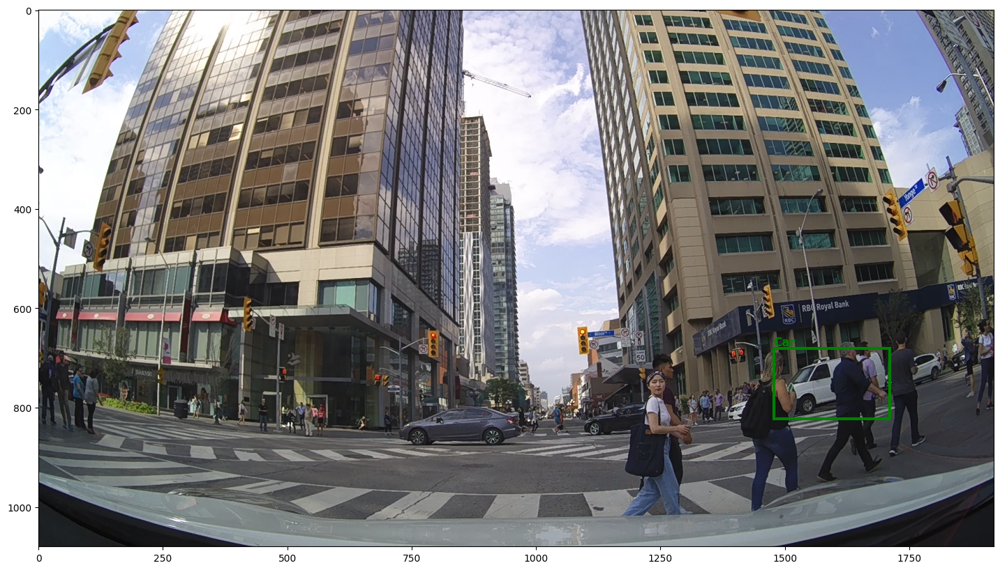

In [13]:
# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/images/set02/video_0002/03300.png"
annotation_file_path = r"C:/Users/vravula/final_pie_env/retrieved_annotations/set02/video_0002/3300.json"

# Read the image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV reads images in BGR, convert to 
# [[cross,xbr, xtl, ybr, ytl]]
annotation_file = [["Car", 1710.90, 1477.37, 822.06, 681.00]]

# Draw bounding boxes on the image
draw_boxes_2(image, annotation_file)

## 1.4 Creating Train and Validation Set

### Resizing Images

In [14]:
def resize_images(input_folder, output_folder, target_size=(640, 640), random_seed=42, validation_split=0.2):
    # Set random seed for reproducibility
    random.seed(random_seed)

    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Create output folders if they don't exist
    train_folder = os.path.join(output_folder, "train")
    val_folder = os.path.join(output_folder, "validation")
    test_folder = os.path.join(output_folder, "test")

    for folder in [train_folder, val_folder, test_folder]:
        if not os.path.exists(folder):
            os.makedirs(folder)
    
    for folder in [train_folder, val_folder, test_folder]:
        if not os.path.exists(os.path.join(folder, "images")):
            os.makedirs(os.path.join(folder, "images"))

    # Get the total number of files for progress tracking
    total_files = sum(len(files) for _, _, files in os.walk(input_folder) if files)

    # Create a progress bar
    progress_bar = tqdm(total=total_files, desc="Resizing Images", unit="image")

    # Get the list of all image files
    image_files = [os.path.join(root, file).replace(os.path.sep, "_") for root, dirs, files in os.walk(input_folder) for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]
    

    train_files, test_val_files = train_test_split(image_files, test_size=validation_split, random_state=random_seed, shuffle=True)
    val_files, test_files = train_test_split(test_val_files, test_size=0.5, random_state=random_seed, shuffle=True)

    # Traverse through the input folder
    for root, dirs, files in os.walk(input_folder):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                # Construct the full path to the image
                input_path = os.path.join(root, file)

                # Read the image
                img = cv2.imread(input_path)

                # Resize the image
                resized_img = cv2.resize(img, target_size)

                # Decide whether to put the image in the training, validation, or test set
                if os.path.join(root, file).replace(os.path.sep, "_") in train_files:
                    output_folder_images = os.path.join(train_folder, "images")
                elif os.path.join(root, file).replace(os.path.sep, "_") in val_files:
                    output_folder_images = os.path.join(val_folder, "images")
                else:
                    output_folder_images = os.path.join(test_folder, "images")

                # Construct the output path by concatenating the path and original filename
                output_filename = os.path.join(root, file).replace(os.path.sep, "_")
                output_path = os.path.join(output_folder_images, output_filename)

                # Save the resized image
                cv2.imwrite(output_path, resized_img)

                # Update the progress bar
                progress_bar.update()

    # Close the progress bar
    progress_bar.close()

In [15]:
# Create the 'training_dataset' directory if it doesn't exist
training_dataset_directory = os.path.join('training', 'training_dataset')
os.makedirs(training_dataset_directory) if not os.path.exists(training_dataset_directory) else None

In [16]:
# Create the 'training_results' directory if it doesn't exist
training_dataset_directory = os.path.join('training', 'training_results')
os.makedirs(training_dataset_directory) if not os.path.exists(training_dataset_directory) else None

In [17]:
 # Resize images
resize_images(input_folder="images", 
              output_folder="training/training_dataset",
              target_size=(640, 640), 
              random_seed=42, 
              validation_split=0.2)

Resizing Images: 100%|██████████| 4922/4922 [03:16<00:00, 24.99image/s]


### Resizing Bounding Boxes

In [18]:
# Function to parse annotations from a JSON file
def parse_annotations(json_file, original_size=(1920, 1080), target_size=(640, 640)):
    with open(json_file, 'r') as f:
        data = json.load(f)

    original_w, original_h = original_size
    target_w, target_h = target_size

    for annotation in data["annotations"]:
        bbox = annotation["bbox"]

        xtl = bbox["xtl"]
        ytl = bbox["ytl"]
        xbr = bbox["xbr"]
        ybr = bbox["ybr"]

        # Resize the bounding box coordinates
        xtl_resized = xtl * (target_w / original_w)
        ytl_resized = ytl * (target_h / original_h)
        xbr_resized = xbr * (target_w / original_w)
        ybr_resized = ybr * (target_h / original_h)

        # Update the original bounding box coordinates
        bbox["xtl"] = xtl_resized
        bbox["ytl"] = ytl_resized
        bbox["xbr"] = xbr_resized
        bbox["ybr"] = ybr_resized

    return data

# Function to resize images in a folder
def resize_bbox(input_folder, output_folder, target_size=(640, 640)):
    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Create output folders if they don't exist
    train_folder = os.path.join(output_folder, "train")
    val_folder = os.path.join(output_folder, "validation")
    test_folder = os.path.join(output_folder, "test")

    for folder in [train_folder, val_folder, test_folder]:
        if not os.path.exists(folder):
            os.makedirs(folder)
    
    for folder in [train_folder, val_folder, test_folder]:
        if not os.path.exists(os.path.join(folder, "annotations")):
            os.makedirs(os.path.join(folder, "annotations"))

    # Get the total number of files for progress tracking
    total_files = sum(len(files) for _, _, files in os.walk(input_folder) if files)

    # Create a progress bar
    progress_bar = tqdm(total=total_files, desc="Resizing Annotations", unit="annotations")

    # Traverse through the input folder
    for root, dirs, files in os.walk(input_folder):
        for file in files:
            # Check if the file is an json
            if file.lower().endswith(('.json')):

                # Construct the full path to the image
                input_path = os.path.join(root, file)

                # Resize the annotations
                resized_annt = parse_annotations(input_path)

                # Extract frame number from the filename (ignoring .json extension)
                frame_number = os.path.splitext(file)[0].split("_")[-1].zfill(5)

                # Construct the corresponding image filename
                image_filename = f"{frame_number}.png"
                image_filename = os.path.join(root, image_filename).replace(os.path.sep, "_")
                image_filename = image_filename.replace('retrieved_annotations', 'images')

                # Decide whether to put the image in the training or validation set
                if os.path.exists(os.path.join(train_folder, "images", image_filename)):
                    output_folder_annotations = os.path.join(train_folder, "annotations")
                elif os.path.exists(os.path.join(val_folder, "images", image_filename)):
                    output_folder_annotations = os.path.join(val_folder, "annotations")
                else:
                    output_folder_annotations = os.path.join(test_folder, "annotations")

                # Construct the output path by concatenating the path and original filename
                output_filename = os.path.join(root, frame_number).replace(os.path.sep, "_")
                output_path = os.path.join(output_folder_annotations, output_filename)
                output_file = os.path.join(f"{output_path}.json")

                # Save the resized annotations
                with open(output_file, 'w') as file:
                    json.dump(resized_annt, file, indent=2)

                # Update the progress bar
                progress_bar.update()

    # Close the progress bar
    progress_bar.close()

In [19]:
resize_bbox(input_folder="retrieved_annotations",
            output_folder="training/training_dataset",
            target_size=(640, 640)
            )

Resizing Annotations: 100%|██████████| 4922/4922 [00:03<00:00, 1307.58annotations/s]


#### Test after resizing

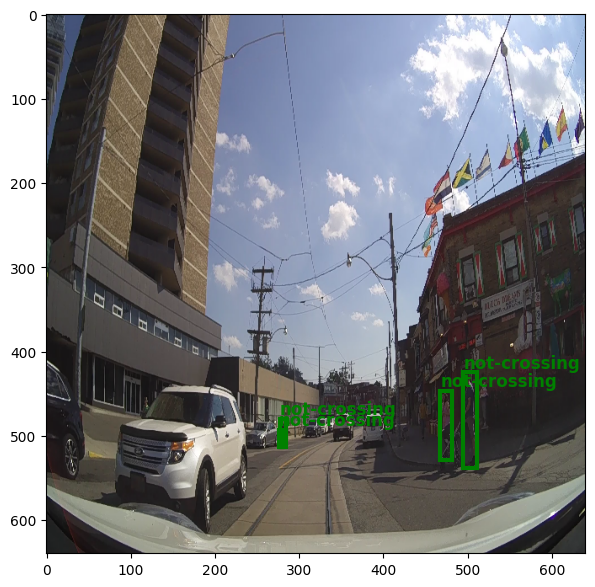

In [20]:
# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/training/training_dataset/train/images/images_set01_video_0001_01440.png"
annotation_file_path = r"C:/Users/vravula/final_pie_env/training/training_dataset/train/annotations/retrieved_annotations_set01_video_0001_01440.json"

# Draw bounding boxes on the image
draw_boxes(image_path, annotation_file_path, fig_size=(7, 7))

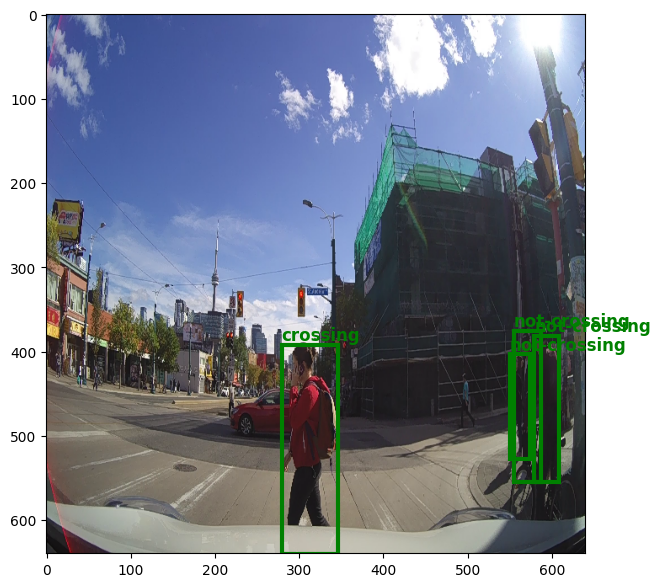

In [21]:
# Path to the image file
image_path = r"C:/Users/vravula/final_pie_env/training/training_dataset/train/images/images_set03_video_0005_03120.png"
annotation_file_path = r"C:/Users/vravula/final_pie_env/training/training_dataset/train/annotations/retrieved_annotations_set03_video_0005_03120.json"

# Draw bounding boxes on the image
draw_boxes(image_path, annotation_file_path, fig_size=(7, 7))

## 1.5 Creating Labels

In [1]:
def parse_annotations(annotation_file_path, img_size=(640, 640)):
    w, h = img_size

    crossing_annotations = []

    with open(annotation_file_path, 'r') as json_file:
        data = json.load(json_file)

    for annotation in data["annotations"]:
        frame = data["frame"]
        bbox = annotation["bbox"]
        cross = annotation["cross"]
        mapped_class = annotation["mapped_class"]

        if cross in ["crossing", "not-crossing", "crossing-irrelevant"]:
            xtl = bbox["xtl"]
            ytl = bbox["ytl"]
            xbr = bbox["xbr"]
            ybr = bbox["ybr"]

            cx = round((xbr + xtl) / (2 * w), 5)
            cy = round((ybr + ytl) / (2 * h), 5)
            bh = round((ybr - ytl) / h, 5)
            bw = round((xbr - xtl) / w, 5)

            crossing_annotations.append({
                "frame": frame,
                "bbox": [cx, cy, bw, bh], #this is the structure yolo expects the value
                "cross": cross,
                "mapped_class": mapped_class 
            })

    return crossing_annotations

def write_txt_files(annotations, output_folder, output_file_name):
    for annotation in annotations:
        frame = annotation['frame']
        cross = annotation['mapped_class']
        bbox = annotation['bbox']

        output_file = os.path.join(output_folder, f"{output_file_name}.txt")
        with open(output_file, 'a') as file:
            file.write(cross + " " + str(bbox[0]) + " " + str(bbox[1]) + " " +str(bbox[2]) + " "+str(bbox[3]) + "\n")


def get_labels(annotation_folder, output_folder):

    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Create output folders if they don't exist
    train_folder = os.path.join(output_folder, "train")
    val_folder = os.path.join(output_folder, "validation")
    test_folder = os.path.join(output_folder, "test")

    for folder in [train_folder, val_folder, test_folder]:
        if not os.path.exists(folder):
            os.makedirs(folder)
    
    for folder in [train_folder, val_folder, test_folder]:
        if not os.path.exists(os.path.join(folder, "labels")):
            os.makedirs(os.path.join(folder, "labels"))

    # Get the total number of files for progress tracking
    total_files = sum(len(files) for _, _, files in os.walk(annotation_folder) if files)

    # Create a progress bar
    progress_bar = tqdm(total=total_files, desc="Getting Labels", unit="labels")

    # Traverse through the input folder
    for root, dirs, files in os.walk(annotation_folder):
        for file in files:
            # Check if the file is an json
            if file.lower().endswith(('.json')):
                # Construct the full path to the image
                input_path = os.path.join(root, file)

                # Get the filename from the path
                file_name = os.path.splitext(os.path.basename(input_path))[0]
                file_name = file_name.split('_')[-4:]
                file_name = '_'.join(file_name)
                
                crossing_annotations = parse_annotations(input_path)

                # Decide whether to put the image in the training or validation set
                if train_folder in input_path:
                    output_folder_annotations = os.path.join(train_folder, "labels")

                if val_folder in input_path:
                    output_folder_annotations = os.path.join(val_folder, "labels")

                if test_folder in input_path:
                    output_folder_annotations = os.path.join(test_folder, "labels")

                # Construct the output path by concatenating the path and original filename
                output_filename = os.path.join("images", file_name).replace(os.path.sep, "_")
                
                write_txt_files(crossing_annotations, output_folder_annotations, output_filename)

                # Update the progress bar
                progress_bar.update()

    # Close the progress bar
    progress_bar.close()

In [4]:
annotation_file_path = r"training/training_dataset/train/annotations/retrieved_annotations_set01_video_0001_01020.json"
parse_annotations(annotation_file_path)

[{'frame': 1020,
  'bbox': [0.49485, 0.78114, 0.00728, 0.05179],
  'cross': 'not-crossing',
  'mapped_class': '1'},
 {'frame': 1020,
  'bbox': [0.49497, 0.78262, 0.00639, 0.04586],
  'cross': 'not-crossing',
  'mapped_class': '1'}]

In [5]:
annotation_file_path = r"training/training_dataset/test/annotations/retrieved_annotations_set01_video_0001_01500.json"
parse_annotations(annotation_file_path)

[{'frame': 1500,
  'bbox': [0.27022, 0.80383, 0.03487, 0.14864],
  'cross': 'crossing-irrelevant',
  'mapped_class': '2'},
 {'frame': 1500,
  'bbox': [0.24815, 0.83389, 0.01609, 0.08731],
  'cross': 'crossing-irrelevant',
  'mapped_class': '2'}]

In [7]:
get_labels(annotation_folder = "training/training_dataset", 
           output_folder ="training/training_dataset")

Getting Labels:  50%|████▉     | 4922/9847 [00:05<00:05, 852.39labels/s] 


# Preparing Prediction Dataset

In [11]:
from pie_data import PIE
pie_path = "C:/Users/vravula/final_pie_env/"
imdb = PIE(data_path = pie_path)
imdb.extract_and_save_images_for_prediction(extract_frame_type = 'annotated', capture_interval_seconds = 1)

Extracting frames from set04
Generating annotated frame numbers for set04
video_0001
Failed to open the video video_0001
Total frames for video_0001: 0


video_0002
Failed to open the video video_0002
Total frames for video_0002: 0


video_0003
Failed to open the video video_0003
Total frames for video_0003: 0


video_0004
Failed to open the video video_0004
Total frames for video_0004: 0


video_0005
[#-------------------] 3.36% Total frames for video_0005: 16200


video_0006
Failed to open the video video_0006
Total frames for video_0006: 0


video_0007
[#-------------------] 3.31% Total frames for video_0007: 18150


video_0008
Failed to open the video video_0008
Total frames for video_0008: 0


video_0009
[#-------------------] 3.31% Total frames for video_0009: 18000


video_0010
Failed to open the video video_0010
Total frames for video_0010: 0


video_0011
Failed to open the video video_0011
Total frames for video_0011: 0


video_0012
Failed to open the video video_0012
Total fr

In [14]:
def resize_images_for_prediction(input_folder, output_folder, target_size=(640, 640)):
    # Create output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Create output folder for images
    images_folder = os.path.join(output_folder, "dataset")
    if not os.path.exists(images_folder):
        os.makedirs(images_folder)

    # Get the total number of files for progress tracking
    total_files = sum(len(files) for _, _, files in os.walk(input_folder) if files)

    # Create a progress bar
    progress_bar = tqdm(total=total_files, desc="Resizing Images", unit="image")

    # Traverse through the input folder
    for root, dirs, files in os.walk(input_folder):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                # Construct the full path to the image
                input_path = os.path.join(root, file)

                # Read the image
                img = cv2.imread(input_path)

                # Resize the image
                resized_img = cv2.resize(img, target_size)

                # Construct the output path by concatenating the path and original filename
                output_filename = os.path.join(root, file).replace(os.path.sep, "_")
                output_path = os.path.join(images_folder, output_filename)

                # Save the resized image
                cv2.imwrite(output_path, resized_img)

                # Update the progress bar
                progress_bar.update()

    # Close the progress bar
    progress_bar.close()

In [15]:
 # Resize images
resize_images_for_prediction(input_folder="detection", 
                            output_folder="detection",
                            target_size=(640, 640))

Resizing Images: 100%|██████████| 790/790 [00:28<00:00, 27.73image/s]
